In [1]:
import sys
sys.path.insert(1, '../../scripts/')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from pathlib import Path
import datetime
from midoss_utils import *
import yaml
import time
import glob
# compress helps to extract values from list based on the value in a column
# e.g. dissolution < 0.0
from itertools import compress

In [2]:
# graphics style
#plt.style.use(r"../presentations/MEOPAR2022/meopar2022_matplotlibrc.template")

In [3]:
color_dict = {"MEvaporated": "darkolivegreen",
              "MDispersed": "darkblue", 
              "MDissolved": "royalblue", 
              "MBio": "skyblue",
              "MFloating": "saddlebrown", 
             "MBeached": "chocolate", 
             "MInitial": "grey",
             "MTotal":"magenta"}
oil_dict = {"akns":"ANS",
            "all":"all",
           "bunker":"Bunker-C",
           "diesel":"Diesel",
           "dilbit":"Dilbit",
           "gas":"Diesel",
           "jet":"Diesel",
           "other":"Bunker-C"}
cols_plot = ["MEvaporated", "MDispersed",  "MDissolved", "MBio", "MFloating", "MBeached", "MInitial","MTotal"]
oil_types = ["Bunker-C", "Diesel", "Dilbit", "ANS"]
# Select True to re-run cataloguing code and False to open "input_file" instead
catalogue_flag = False

In [4]:
# load yaml file with filepaths for .sro files
file_paths = '/scratch/rmueller/MIDOSS/Results/MOHID_massbalance_13022022_18:10:19.yaml'
output_dir =Path('/scratch/rmueller/MIDOSS/Results')
input_file_oil = output_dir / 'SOILED_massbalance_byoil_24022022_14:22:57.yaml'
input_file_all = output_dir / 'SOILED_massbalance_all_24022022_14:13:17.yaml'

### Initialize dictionaries and lists

In [22]:
# For debugging purposes: Create count dictionary of files opened by oil type
count = {}
for oil in ["Bunker-C", "Diesel", "Dilbit", "ANS", "all"]:
    count[oil]=0
# For debugging purposts: Create list of files with negative dissolution values
diss_files = []
# list of variables to save from .sro file
variables = ['MEvaporated', 'MDispersed', 'MDissolved',
             'MBio','MassOil','VolOilBeached',
             'Density','VWaterContent','MWaterContent']
# initialize dictionary for cataloguing all output 
all_output={}
all_output['diss_bool'] = []
all_output['oil_type']=[]
all_output['month'] = []
all_output['days_since_spill']=[]
all_output['MBeached']=[]
for var in variables:
        all_output[var]=[]
# initialize dictionary for cataloguing output by oil types
output = {}
for oil in ["Bunker-C", "Diesel", "Dilbit", "ANS"]:
    output[oil]={}
    output[oil]['month']=[]
    output[oil]['days_since_spill']=[]
    output[oil]['MBeached']=[]
    output[oil]['init_density']=[]
    for var in variables:
            output[oil][var]=[]

### Save mass balance information from last time step for oil categories
- `count`: dictionay with number of entries per grouping ("Bunker-C", "Diesel", "Dilbit", "ANS", "all")
- `all_output`: dictionary of mass balance categories and other information for all oil types
- `output`: dictionary of mass balance categorized by oil types

In [6]:
if catalogue_flag:
    with open(file_paths) as file:
        sro_files = yaml.safe_load(file)
    # load mass balance from .sro files for each oil type
    for fnum,file in enumerate(sro_files["all"]):               
        sro_file = sro_files["all"][fnum]
        # ~~~ Get oil type from Lagrangian file ~~~
        sro_directory = '/'.join(sro_file.split('/')[:-1])
        Lagrangian_fname = glob.glob(sro_directory + '/Lagrangian*')[0].split('/')[-1]
        oilname = Lagrangian_fname.split('_')[1].split('-')[0]
        # ~~~ Load data and tidy it up ~~~
        data = pandas.read_csv(sro_file, sep="\s+", skiprows=4)
        # remove first entry of NaN values
        data = data.drop([0], axis=0)
        length = len(data)
        # Make sure there is data in the file
        if length>4:
            # Add oil type to list of saved attributes
            all_output["oil_type"].append(oilname)
            # tidy up NaN and garbage entries at end of file
            data = data.drop([length-3, length-2, length-1, length], axis=0)
            data_last = data[-1:]
            # Save files with negative Dissolution 
            if (data_last["MDissolved"].item() < 0):
                diss_files.append(sro_file)
                all_output["diss_bool"].append(True)
            else:
                all_output["diss_bool"].append(False)
            # Count files to help debug
            count["all"]+=1
            all_output["month"].append(int(data_last["MM"].item()))
            all_output["days_since_spill"].append(float(data_last["Seconds"])/86400)
            # Catalogue last value for each, selected variable
            for var in variables:
                all_output[var].append(data_last[var].item())
            # calculate MBeached
            all_output["MBeached"].append(
                (data_last["VolOilBeached"]*data_last["Density"]/(1-data_last["VWaterContent"])*(1-data_last["MWaterContent"])).item())           
        else:
            print(sro_file)
            continue
    # write filenames to .yaml with timestamp in filename
    now = datetime.datetime.now()
    dt_string = now.strftime("%d%m%Y_%H:%M:%S")
    out_f_all = output_dir/f'SOILED_massbalance_all_{dt_string}.yaml'
    with open(out_f_all, 'w') as output_yaml:
        documents = yaml.safe_dump(all_output, output_yaml)
    diss_out = output_dir/'files_with_negative_dissolution.yaml'
    with open(diss_out, 'w') as output_yaml:
        documents = yaml.safe_dump(diss_files, output_yaml)
else:
    with open(input_file_all, 'r') as input_yaml:
        sro_all = yaml.safe_load(input_yaml)

### Save mass balance information from last time step for oil categories


In [20]:
with open(file_paths) as file:
        sro_files = yaml.safe_load(file)
dens = []
for fname in sro_files['akns'][0]:
    data = pandas.read_csv(sro_files['akns'][0], sep="\s+", skiprows=4)
    # remove first entry of NaN values
    data = data.drop([0], axis=0)
    length = len(data)
    Make sure there is data in the file
    if length>4:
        # tidy up NaN and garbage entries at end of file
        data = data.drop([length-3, length-2, length-1, length], axis=0)
    dens.append(data['Density'][1])

In [23]:
%%time
# open yaml file that contains dictionary of file paths created in 
# create_SOILED_sro_runlist.ipynb and catalogue data.
catalogue_flag=1
if catalogue_flag:
    with open(file_paths) as file:
        sro_files = yaml.safe_load(file)
    # loop through oils and catalogue data
    iter_list = [oiltype for oiltype in [*sro_files] if oiltype != 'all']
    for oil in iter_list:
        print(oil)  
        # load mass balance from .sro files for each oil type
        for fnum,file in enumerate(sro_files[oil]):               
            sro_file = sro_files[oil][fnum]
             #~~~ Load data and tidy it up ~~~
            data = pandas.read_csv(sro_file, sep="\s+", skiprows=4)
            # remove first entry of NaN values
            data = data.drop([0], axis=0)
            length = len(data)
            # Make sure there is data in the file
            if length>4:
                # tidy up NaN and garbage entries at end of file
                data = data.drop([length-3, length-2, length-1, length], axis=0)
                data_last = data[-1:]
                # Count files to help debug
                count[oil_dict[oil]]+=1
                output[oil_dict[oil]]['month'].append(int(data_last["MM"].item()))
                output[oil_dict[oil]]['days_since_spill'].append(float(data_last["Seconds"])/86400)
                # Catalogue last value for each, selected variable
                for var in variables:
                    output[oil_dict[oil]][var].append(data_last[var].item())
                # add initial mass
                mass['MTotal'] = [row['MEvaporated']+row['MDispersed']+row['MDissolved']+row['MBio']+row['MassOil']+row['MBeached'] for day, row in mass.iterrows()]
                output[oil_dict[oil]]['InitialMass'].append(
                    data['MEvaporated'][1].item() + data['MDispersed'][1].item() + 
                    data['MDissolved'][1].item() + data['MBio'][1].item() + 
                    data['MFloating'][1].item() + data['MBeached'][1].item()
                )
                # calculate MBeached
                output[oil_dict[oil]]['MBeached'].append(
                    (data_last['VolOilBeached']*data_last['Density']/(1-data_last['VWaterContent'])*(1-data_last['MWaterContent'])).item())           
            else:
                print(sro_file)
                continue
    for oil in iter_list: 
        print(f"{oil}: {len(output[oil_dict[oil]]['MBeached'])}")
    # rename MassOil for more transparancy of meaning
    # This doesn't work....hmmm....
    # for oil in [*output]:
    #     output[oil] = output[oil].rename(columns={"MassOil":"MFloating"})            
    # write filenames to .yaml with timestamp in filename
    now = datetime.datetime.now()
    dt_string = now.strftime("%d%m%Y_%H:%M:%S")
    out_f_oils = output_dir/f'SOILED_massbalance_byoil_{dt_string}.yaml'
    with open(out_f_oils, 'w') as output_yaml:
        documents = yaml.safe_dump(output, output_yaml)
    diss_out = output_dir/'files_with_negative_dissolution.yaml'
    with open(diss_out, 'w') as output_yaml:
        documents = yaml.safe_dump(diss_files, output_yaml)
else:
    with open(input_file_oil, 'r') as input_yaml:
        sro = yaml.safe_load(input_yaml)

akns
bunker
diesel
/scratch/dlatorne/MIDOSS/runs/monte-carlo/14-200_near-BP_spill-hr_2021-12-15T132231/results/14-200_near-BP_spill-hr-141/MassBalance_14-200_near-BP_spill-hr-141.sro
dilbit
gas
jet
other
akns: 30
bunker: 1214
diesel: 2030
dilbit: 1
gas: 2030
jet: 2030
other: 1214


RepresenterError: ('cannot represent an object', 874.655329856)

In [28]:
output[oil_dict['ANS']]['init_density']

KeyError: 'ANS'

In [8]:
###### with open(file_paths) as file:
#     sro_files = yaml.safe_load(file)
#     # load mass balance from .sro files for each oil type
#     for fnum,file in enumerate(sro_files['all']):               
#         sro_file = sro_files['all'][fnum]
#          #~~~ Load data and tidy it up ~~~
#         data = pandas.read_csv(sro_file, sep="\s+", skiprows=4)
#         # remove first entry of NaN values
#         data = data.drop([0], axis=0)
#         length = len(data)
#         # Make sure there is data in the file
#         if length>4:
#             # tidy up NaN and garbage entries at end of file
#             data = data.drop([length-3, length-2, length-1, length], axis=0)
#             data_last = data[-1:]
#             # Save files with negative Dissolution 
#             if data_last['MDissolved'].item() < 0:
#                 print('yes')
#                 diss_files.append(sro_file)
#                 diss_bool.append(True)
#             else:
#                 diss_bool.append(False)
            

In [9]:
if catalogue_flag:
    with open(out_f_oils) as file:
        sro_oils = yaml.safe_load(file)
    with open(out_f_all) as file:
        sro_all = yaml.safe_load(file)
else:
    with open(input_file_oil) as file:
        sro = yaml.safe_load(file)

In [10]:
MDispersed = numpy.asarray(sro_all['MDispersed'])
MEvaporated = numpy.asarray(sro_all['MEvaporated'])
MDissolved = numpy.asarray(sro_all['MDissolved'])
MBio = numpy.asarray(sro_all['MBio'])
MSurface = numpy.asarray(sro_all['MassOil']) #surface oil
MBeached = numpy.asarray(sro_all['MBeached'])
Mtotal = MEvaporated + MDispersed + MDissolved + MBio + MSurface + MBeached

In [35]:
all_oils_df = pd.DataFrame.from_dict(sro_all, orient='columns')

In [36]:
all_oils_df.head(1)

,Density,MBeached,MBio,MDispersed,MDissolved,MEvaporated,MWaterContent,MassOil,VWaterContent,VolOilBeached,days_since_spill,diss_bool,month,oil_type
0,996.434679,5276.929516,0.055102,0.022747,0.007893,2.785565e-13,0.0,2.100544,0.0,5.295811,6.916667,False,2,bunker


In [38]:
negative_diss = all_oils_df.loc[all_oils_df['diss_bool']==True]

Text(0.5, 1.0, 'Bunker spills with \n negative dissolution')

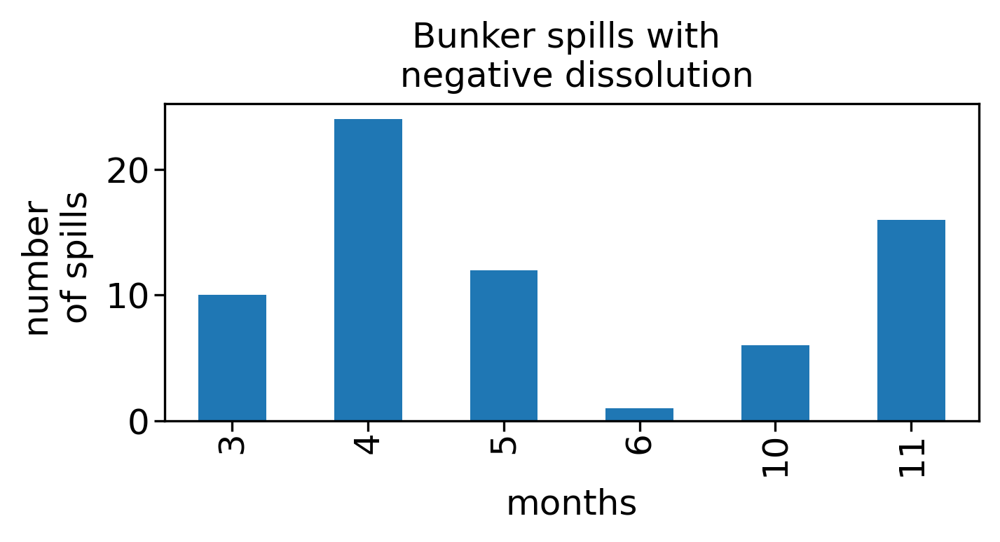

In [68]:
plt.rcParams["figure.figsize"] = '5,2'
ax = negative_diss['Density'].groupby(negative_diss['month']).count().plot.bar(fontsize=12)
ax.set_ylabel('number \n of spills',fontsize=12)
ax.set_xlabel('months',fontsize=12)
ax.set_title('Bunker spills with \n negative dissolution',fontsize=12)

<AxesSubplot:xlabel='month'>

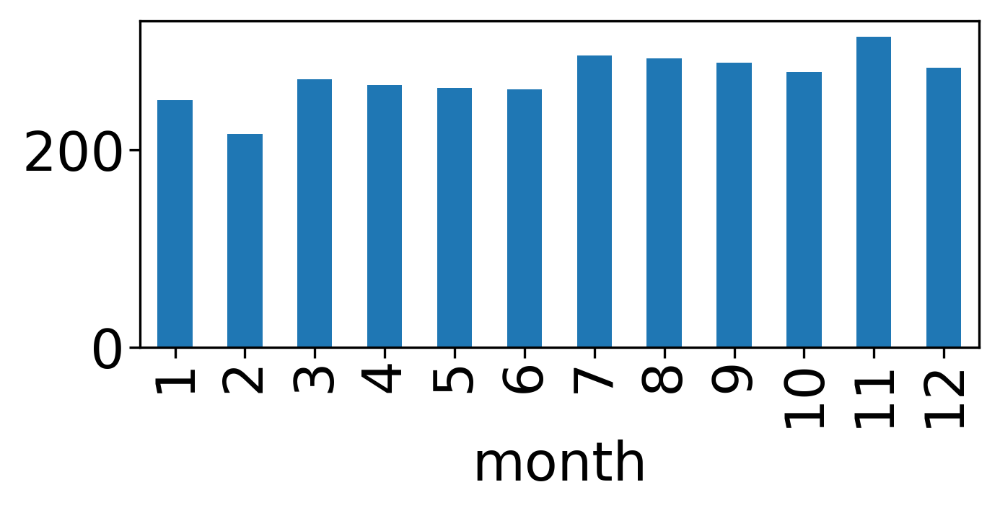

In [55]:
plt.rcParams["figure.figsize"] = '5,2'
ax = all_oils_df['Density'].groupby(all_oils_df['month']).count().plot.bar()
ax.set_ylabel('number \n of spills',fontsize=12)
ax.set_xlabel('months',fontsize=12)
ax.set_title('All bunker spills',fontsize=12)


### Plot individual runs with negative dissolution

In [ ]:
results[oil] = load_sro(fname[oil],['MEvaporated', 'MDispersed', 'MDissolved','MBio','MassOil','VolOilBeached','Density','VWaterContent','MWaterContent'])
    results[oil] = results[oil].rename(columns={"MassOil":"MFloating"})
    # calculate mass of beached oil (this step will eventually be inherent to the "load_sro" script)
    results[oil]['MBeached'] = [row['VolOilBeached']*row['Density']/(1-row['VWaterContent'])*(1-row['MWaterContent']) for day, row in results[oil].iterrows()]
    # net mass of weathered oil
    results[oil]['MTotal'] = [row['MEvaporated']+row['MDispersed']+row['MDissolved']+row['MBio']+row['MFloating']+row['MBeached'] for day, row in results[oil].iterrows()]
    #results[oil] = results[oil].drop(['VolOilBeached','Density'], axis=1)
    # Initial spill mass
    spill_volume = 10000 #m3
    initial_density = results[oil]['Density'][0] #kg/m3
    results[oil]['MInitial'] = [spill_volume * initial_density for i in range(len(results[oil].Density))]

/home/rmueller/venvs/jupyter/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


findfont: Font family ['arial'] not found. Falling back to DejaVu Sans.


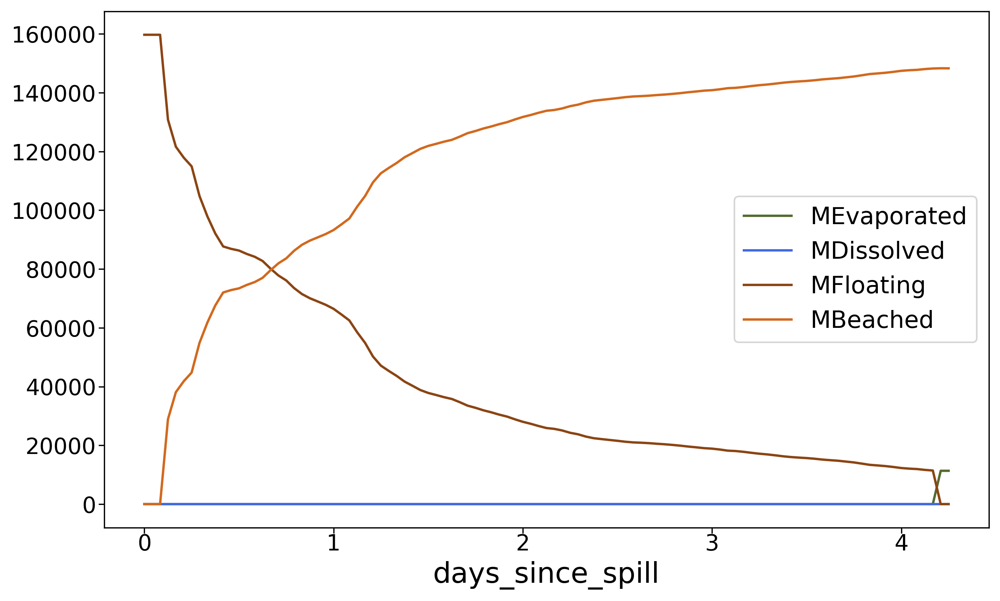

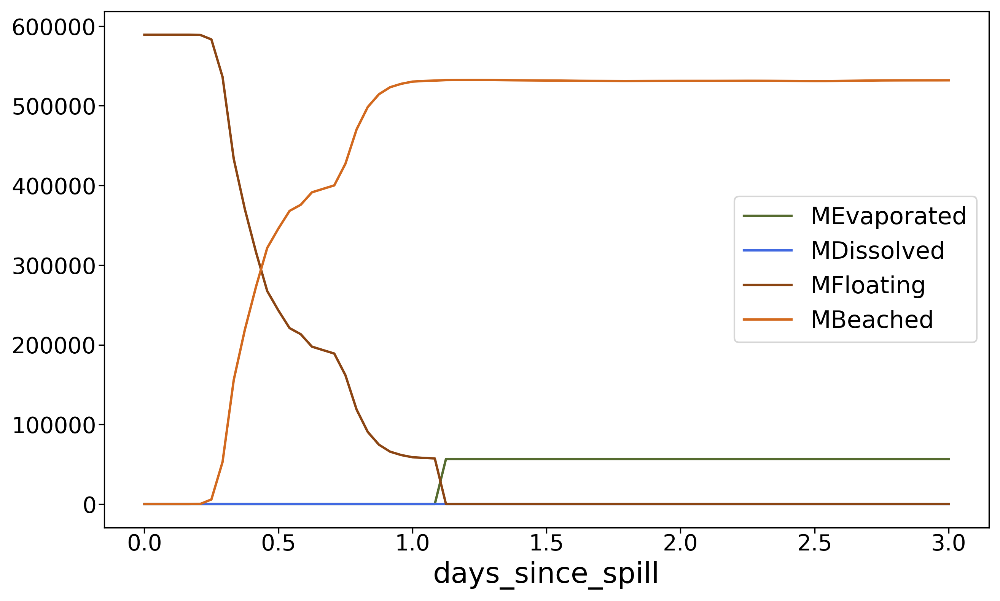

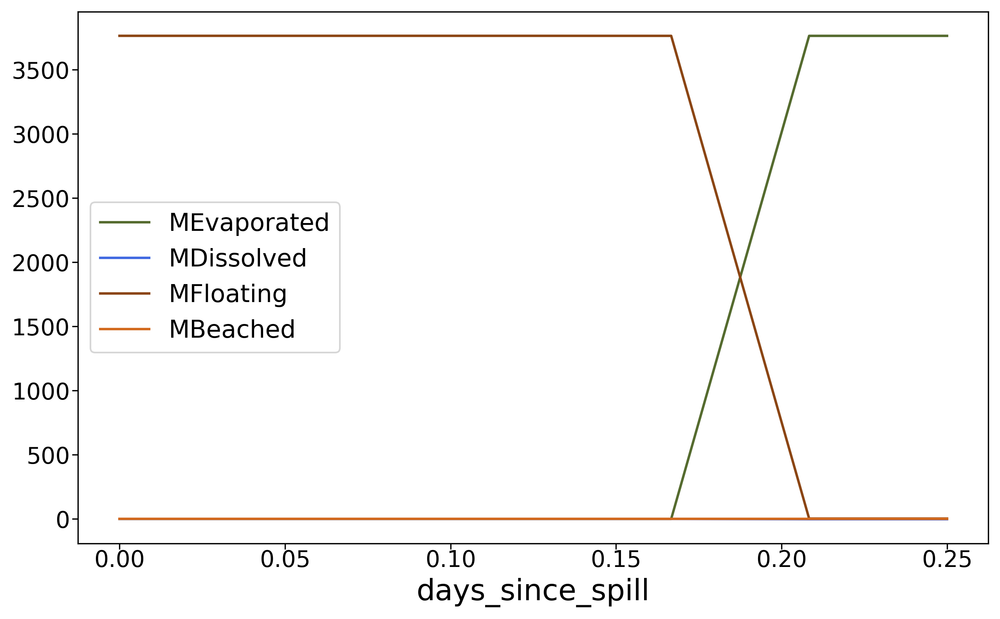

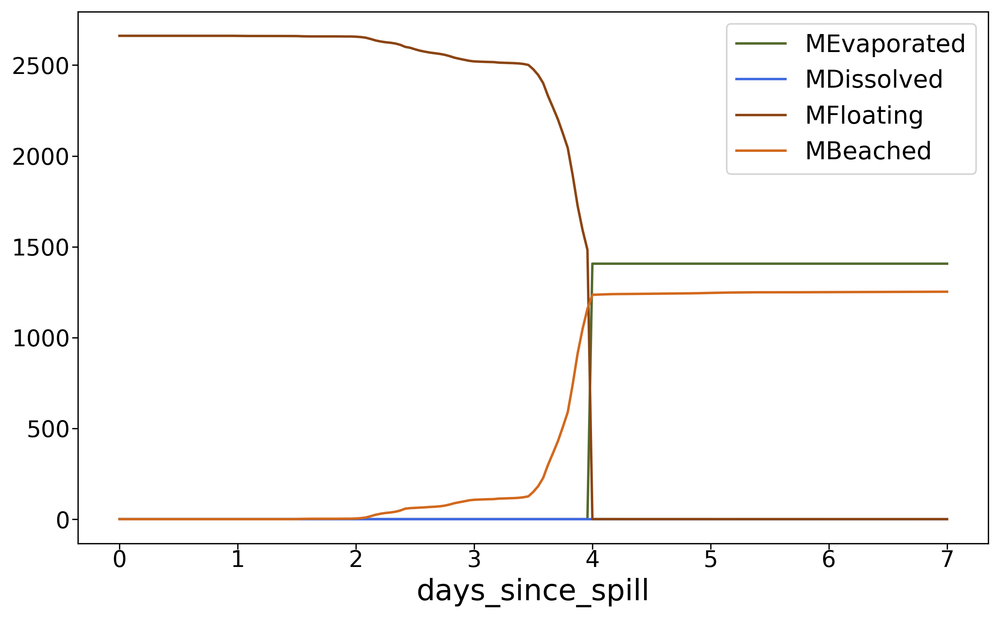

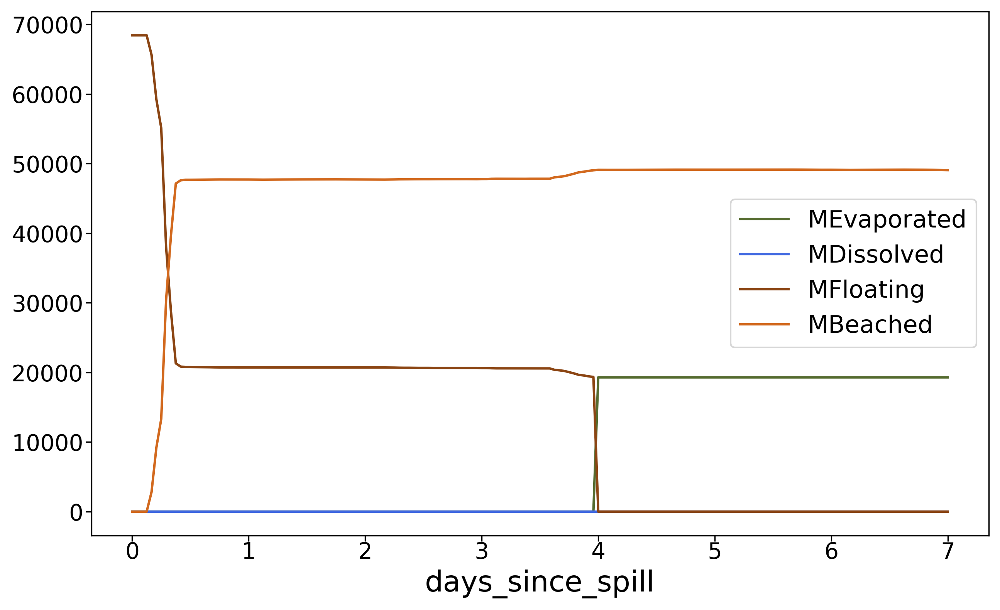

...

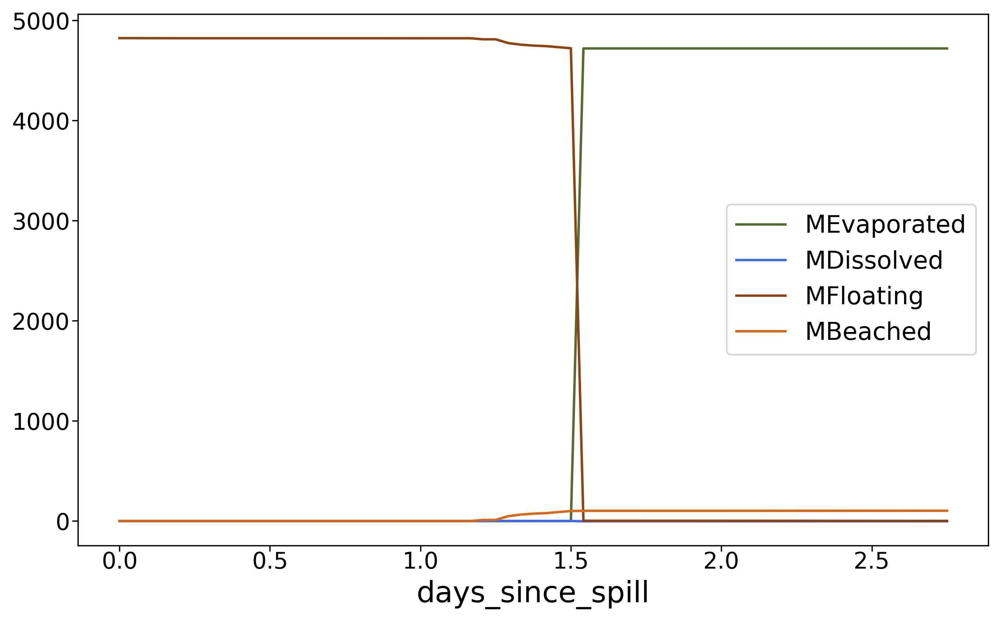

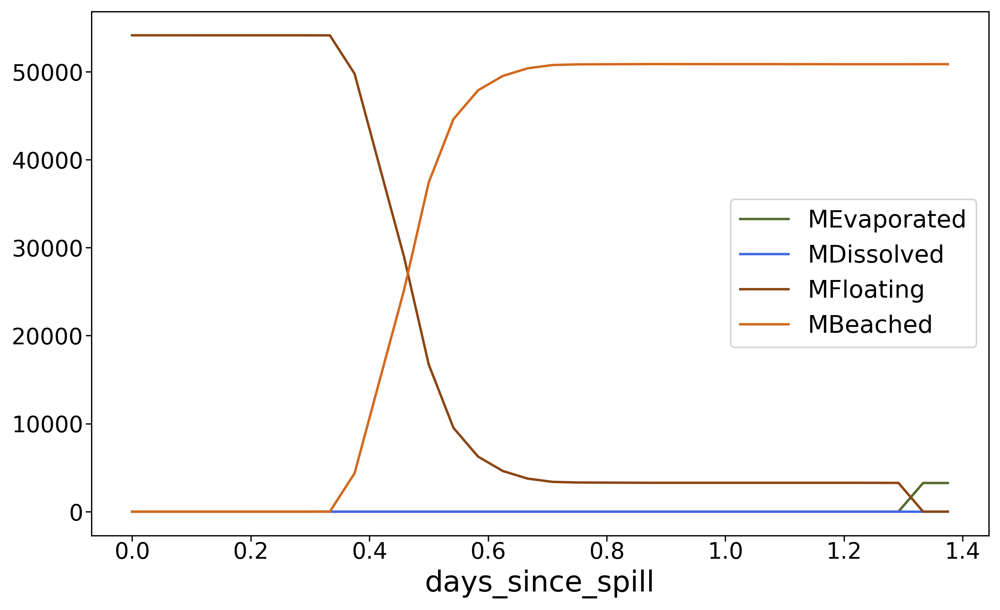

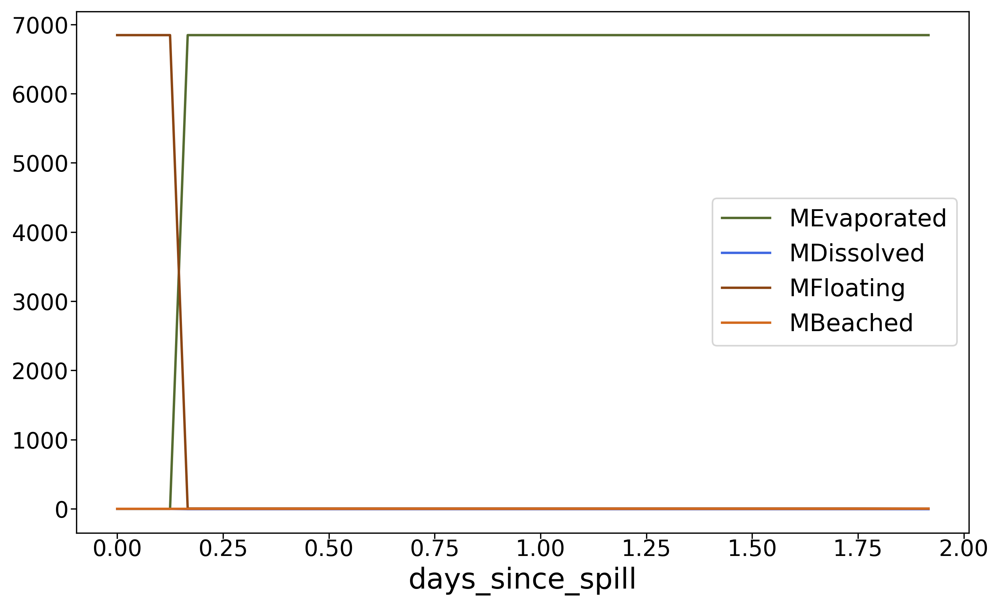

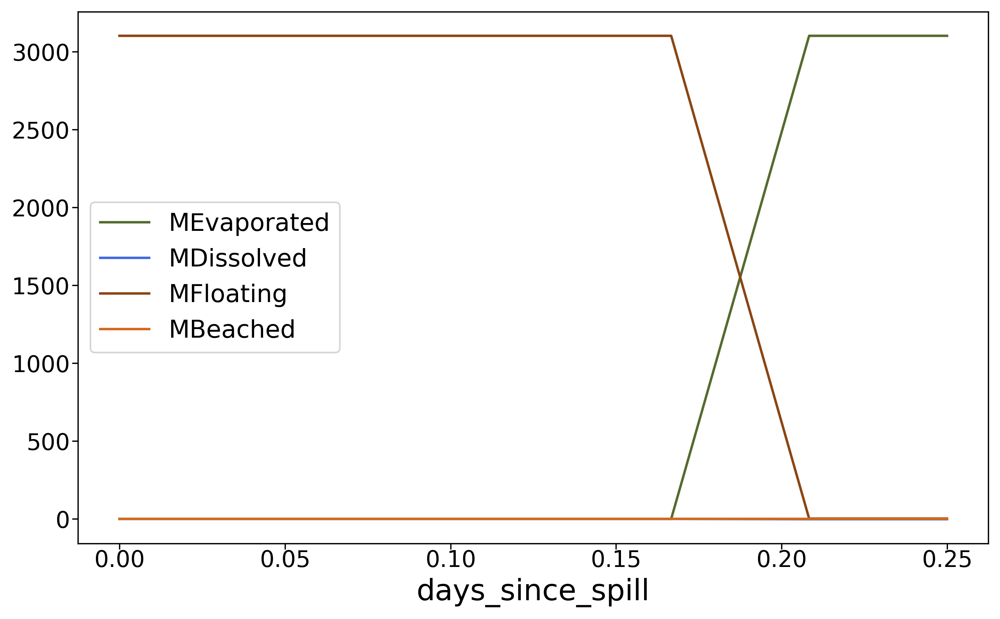

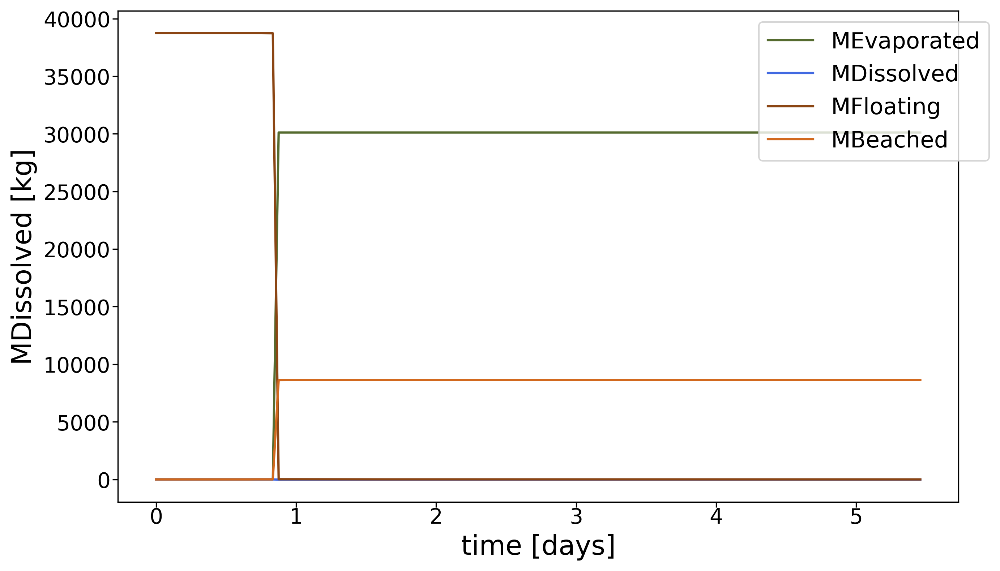

In [7]:
file_list = output_dir / 'files_with_negative_dissolution.yaml'
#cols_plot = ["MEvaporated", "MDispersed",  "MDissolved", "MBio", "MFloating", "MBeached", "MInitial","MTotal"]
cols_plot = ["MEvaporated", "MFloating", "MBeached"]
color_dict = {"MEvaporated": "darkolivegreen",
              "MDispersed": "darkblue", 
              "MDissolved": "royalblue", 
              "MBio": "skyblue",
              "MFloating": "saddlebrown", 
             "MBeached": "chocolate", 
             "MInitial": "grey",
             "MTotal":"magenta"}
with open(file_list) as file:
        sro_files = yaml.safe_load(file)
        for fnum,file in enumerate(sro_files):               
            sro_file = sro_files[fnum]
            results = load_sro(sro_file,['MEvaporated', 'MDispersed', 'MDissolved','MBio','MassOil','VolOilBeached','Density','VWaterContent','MWaterContent'])
            results = results.rename(columns={"MassOil":"MFloating"})
            # calculate mass of beached oil (this step will eventually be inherent to the "load_sro" script)
            results['MBeached'] = [row['VolOilBeached']*row['Density']/(1-row['VWaterContent'])*(1-row['MWaterContent']) for day, row in results.iterrows()]
    
            ax = results[cols_plot].plot(
                linewidth=1.5,
                color = [color_dict.get(column_name,'#333333') for column_name in cols_plot],
                figsize = (10,6),
                fontsize = 14
            )
            ax2=ax.twinx()
            ax2.plot(results['MDissolved'].plot(
                linewidth=1.5,
                color = [color_dict.get(column_name,'#333333') for column_name in cols_plot],
                figsize = (10,6),
                fontsize = 14
            )
ax.set_ylabel('Mass [kg]')
ax2.set_ylabel('Mass [kg]')
ax.set_xlabel('time [days]')
ax.legend(bbox_to_anchor=(1.05, 1))

TypeError: bar() missing 1 required positional argument: 'height'

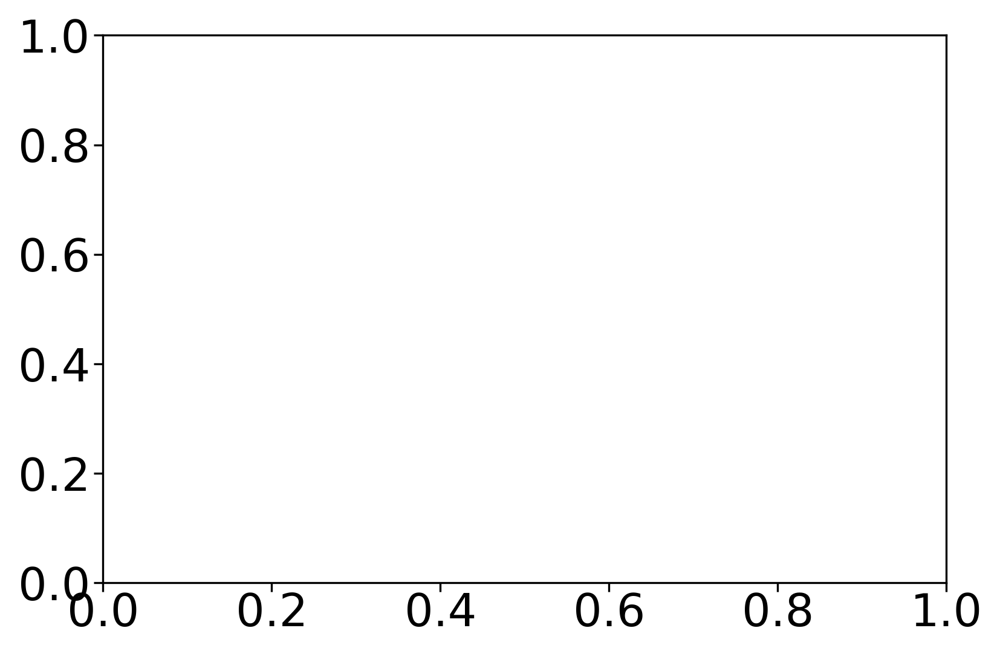

In [46]:
with open(file_list) as file:
        sro_files = yaml.safe_load(file)
        for fnum,file in enumerate(sro_files):               
            sro_file = sro_files[fnum]
            results = load_sro(sro_file,['MEvaporated', 'MDispersed', 'MDissolved','MBio','MassOil','VolOilBeached','Density','VWaterContent','MWaterContent'])
            results = results.rename(columns={"MassOil":"MFloating"})
            # calculate mass of beached oil (this step will eventually be inherent to the "load_sro" script)
            results['MBeached'] = [row['VolOilBeached']*row['Density']/(1-row['VWaterContent'])*(1-row['MWaterContent']) for day, row in results.iterrows()]
    
            ax = results['MDissolved'].plot(
                linewidth=1.5,
                color = [color_dict.get(column_name,'#333333') for column_name in cols_plot],
                figsize = (10,6),
                fontsize = 14
            )
ax.set_ylabel('MDissolved [kg]')
ax.set_xlabel('time [days]')
ax.legend(bbox_to_anchor=(1.05, 1))

In [32]:
# create boolean to use for extracting values from arrays
MDissolved[sro_all['diss_bool']]

array([-1.70314777e+00, -1.07273318e+01, -2.59640044e+00, -3.83865179e-01,
       -4.98534651e+00, -4.25124365e-01, -4.67438802e+01, -9.21448243e+00,
       -1.17554325e-01, -3.15226174e+01, -1.42864591e+01, -5.13563154e+00,
       -4.45822144e+02, -6.03761785e+01, -2.61935146e+00, -9.69816831e-01,
       -6.71041469e+01, -6.94027752e+01, -3.97009610e+00, -2.36080753e+01,
       -1.85557666e+00, -8.28909133e+00, -1.04470899e+02, -5.38650629e+01,
       -3.87961826e+01, -3.40826101e+00, -9.85085546e-01, -2.86934545e+01,
       -2.49425097e+02, -1.19912247e-02, -6.94588465e+00, -3.35738691e+02,
       -2.17173249e+00, -1.98733454e+02, -9.09159513e+02, -1.67845004e-01,
       -3.59826339e+01, -1.03976851e+02, -6.53209123e+00, -2.48430405e+01,
       -5.32525106e-01, -1.84049893e+00, -4.26277455e+01, -1.84515136e+03,
       -9.28189336e+01, -1.11546483e+02, -1.89799154e+00, -6.01315148e-01,
       -8.83914815e+02, -6.86248566e+01, -3.28074985e+02, -3.38283221e-01,
       -3.47090052e+01, -

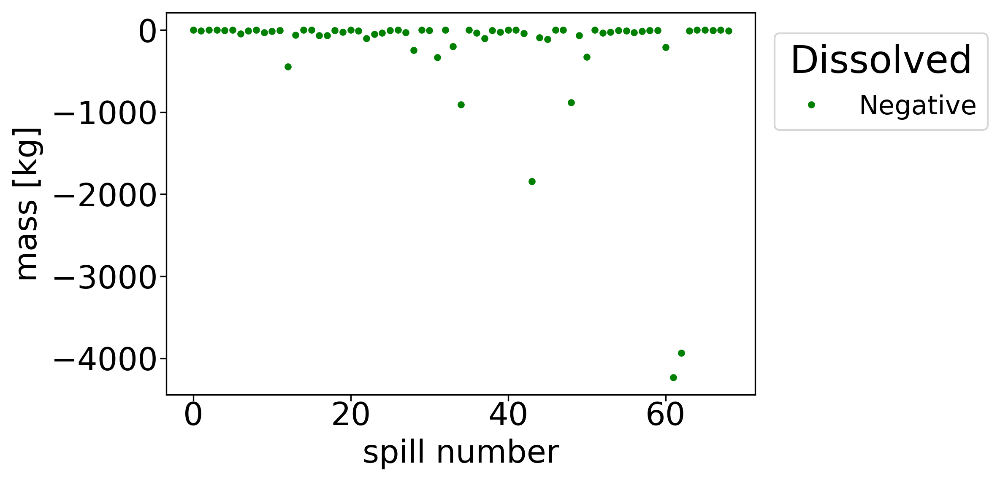

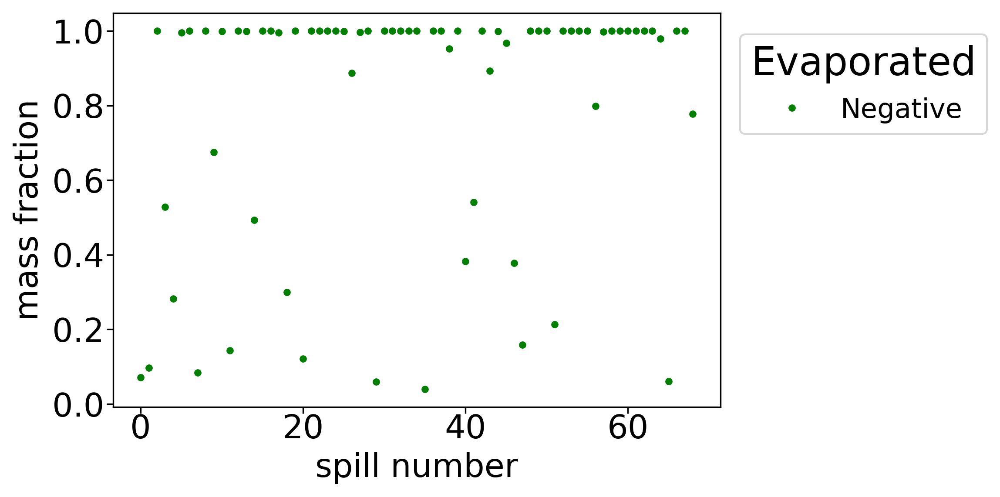

In [34]:
mass_elements = ['MEvaporated', 'MDispersed','MDissolved', 'MBio', 'MSurface', 'MBeached']
   
fig, ax = plt.subplots()
#ax.plot(MDissolved,'.',label='All')
ax.plot(MDissolved[sro_all['diss_bool']],'.',c='g',label='Negative')
ax.set_ylabel('mass [kg]')
ax.set_xlabel('spill number')
ax.legend(title='Dissolved', bbox_to_anchor=(1.01, 0.98), loc='upper left')

fig, ax = plt.subplots()
ax.plot(MEvaporated[sro_all['diss_bool']]/Mtotal[sro_all['diss_bool']],'.',c='g',label='Negative')
ax.set_ylabel('mass fraction')
ax.set_xlabel('spill number')
ax.legend(title='Evaporated', bbox_to_anchor=(1.01, 0.98), loc='upper left')



### Evaluate negative dissolution runs

In [13]:
elements = ['MBeached','MBio','MDispersed','MDissolved','MEvaporated']
#for element in elements:
# create array of mass value where dissolution < 0, with a very un-inspired naming convention!
numerator = numpy.array(list(compress(MDissolved, sro['all']['diss_bool'])))
# create array of total mass for individual spill
denominator = numpy.array(list(compress(Mtotal,sro['all']['diss_bool'])))
# mass fraction for each element
fraction = numerator/denominator
fig, ax = plt.subplots()
ax.plot(fraction,'.',label='MDissolved')
ax.set_ylabel('mass [kg]')
ax.set_xlabel('spill number')
plt.title(element)
ax.legend(title='weathering type', bbox_to_anchor=(1.01, 0.98), loc='upper left')

NameError: name 'sro' is not defined

### Evaluate all runs

In [ ]:
MIDOSScolors={
    'ANS': 'purple',
    'Bunker-C':'teal',
    'Dilbit':'magenta',
    'Diesel':'cornflowerblue',
}

In [ ]:
oils=['Bunker-C', 'Diesel', 'Dilbit','ANS']

mean = {}
mean['MDispersed'] = []
mean['MEvaporated'] = []
mean['MDissolved'] = []
mean['MBio'] = []
mean['MSurface'] = []
mean['MBeached'] = []

median = {}
median['MDispersed'] = []
median['MEvaporated'] = []
median['MDissolved'] = []
median['MBio'] = []
median['MSurface'] = []
median['MBeached'] = []

# fraction of spill
spill_fraction = {}
spill_fraction['MDispersed'] = {}
spill_fraction['MEvaporated'] = {}
spill_fraction['MDissolved'] = {}
spill_fraction['MBio'] = {}
spill_fraction['MSurface'] = {}
spill_fraction['MBeached'] = {}

fig, ax = plt.subplots(1,3,figsize=(15,8))
print('*** Days since spill at last time step ***')
print('min, max, mean, median')
mass_arr = np.array([])
# spill_fraction['MDispersed']['all'] = []
# spill_fraction['MEvaporated']['all'] = []
# spill_fraction['MDissolved']['all'] = []
# spill_fraction['MBio']['all'] = []
# spill_fraction['MSurface']['all'] = []
# spill_fraction['MBeached']['all'] = []
for oil in oils:
    MDispersed = numpy.asarray(sro[oil]['MDispersed'])
    MEvaporated = numpy.asarray(sro[oil]['MEvaporated'])
    MDissolved = numpy.asarray(sro[oil]['MDissolved'])
    MBio = numpy.asarray(sro[oil]['MBio'])
    MSurface = numpy.asarray(sro[oil]['MassOil']) #surface oil
    MBeached = numpy.asarray(sro[oil]['MBeached'])
    Mtotal = MEvaporated + MDispersed + MDissolved + MBio + MSurface + MBeached
    # store month and mass information for scaling scatter plot markers
    month = numpy.asarray(sro['all']['month'])
    month = numpy.asarray(sro[oil]['month'])
    mass_arr = np.concatenate((mass_arr, Mtotal))
    # calculate fraction of spill
    spill_fraction['MDispersed'][oil] = []
    spill_fraction['MEvaporated'][oil] = []
    spill_fraction['MDissolved'][oil] = []
    spill_fraction['MBio'][oil] = []
    spill_fraction['MSurface'][oil] = []
    spill_fraction['MBeached'][oil] = []
    # 
    spill_fraction['MDispersed'][oil] = MDispersed/Mtotal
    spill_fraction['MEvaporated'][oil] = MEvaporated/Mtotal
    spill_fraction['MDissolved'][oil] = MDissolved/Mtotal
    spill_fraction['MBio'][oil] = MBio/Mtotal
    spill_fraction['MSurface'][oil] = MSurface/Mtotal
    spill_fraction['MBeached'][oil] = MBeached/Mtotal
    # spill_fraction['MDispersed']['all'] = MDispersed/Mtotal
    # spill_fraction['MEvaporated']['all'] = MEvaporated/Mtotal
    # spill_fraction['MDissolved']['all'] = MDissolved/Mtotal
    # spill_fraction['MBio']['all'] = MBio/Mtotal
    # spill_fraction['MSurface']['all'] = MSurface/Mtotal
    # spill_fraction['MBeached']['all'] = MBeached/Mtotal
    # calculate mean
    mean['MDispersed'].append(numpy.mean(MDispersed))
    mean['MEvaporated'].append(numpy.mean(MEvaporated))
    mean['MDissolved'].append(numpy.mean(MDissolved))
    mean['MBio'].append(numpy.mean(MBio))
    mean['MSurface'].append(numpy.mean(MSurface))
    mean['MBeached'].append(numpy.mean(MBeached))
    # calculate median
    median['MDispersed'].append(numpy.median(MDispersed))
    median['MEvaporated'].append(numpy.median(MEvaporated))
    median['MDissolved'].append(numpy.median(MDissolved))
    median['MBio'].append(numpy.median(MBio))
    median['MSurface'].append(numpy.median(MSurface))
    median['MBeached'].append(numpy.median(MBeached))
    print(f"{numpy.min(sro[oil]['days_since_spill']):2.1f}",
          f"{numpy.max(sro[oil]['days_since_spill']):2.1f}",
          f"{numpy.mean(sro[oil]['days_since_spill']):2.1f}",
          f"{numpy.median(sro[oil]['days_since_spill']):2.1f}",
         f" [{oil}]")
    
    ax[0].scatter(sro[oil]['days_since_spill'],
                  MEvaporated/Mtotal, 
                  c=MIDOSScolors[oil], 
                  label=oil)
    ax[1].scatter(sro[oil]['days_since_spill'], 
                  MEvaporated/Mtotal, 
                  s=40*Mtotal/3e5, #scaled by ~mean
                  alpha=0.5,
                  c=MIDOSScolors[oil], 
                  label=oil)
    ax[2].scatter(sro[oil]['days_since_spill'], 
                  MEvaporated/Mtotal, 
                  s=300*(1-numpy.absolute((month-6)/6)),
                  alpha=0.5,
                  c=MIDOSScolors[oil], 
                  label=oil)
    
    
ax[0].legend(title='oil types',
         bbox_to_anchor=(3.51, 0.98), 
         loc='upper left')
ax[0].set_title('Fraction of Evaporated Mass \n by Total Mass')
ax[1].set_title('scaled by \n spill size')
ax[2].set_title('scaled by \n spill month \n(larger->warmer)')
ax[0].set_ylabel('Evaporated/Total Mass')
ax[0].set_xlabel('time (days)')
for ax_ind in [1,2]:
    ax[ax_ind].set_yticklabels([])
    ax[ax_ind].set_xlabel('time (days)')
plt.show()

### Graphic explanation:
From left to right, the above graphic shows: 
- (a) all spill's evaporation fraction from the last time-step, 
- (b) the same as (a) but with the evaporation fraction scaled by the mean spill mass of all spills
- (c) the same as (a) but with the evaporation fraction scaled by the month of the spill, where the largest size reflects June spill month and the smallest size reflects winter spill months (January and December)

**Take-away**: Evaporation fraction doesn't appear to be strongly influenced by spill size or spill month.  A plausible explanation is that evaporation is set by SST and these two metrics don't track SST (as well as region of spill might?).  I can't yet explain why some Bunker-C spills have such a large Evaporation fraction and why the evaporation fraction for Bunker-C appears to be bimodal.  I see this bimodal fate behavior as a curious result to dig into more. See `MDisolved` below for possible insight.  Do the negative `MDisolved` runs match the runs with high evaporation rate fractions? Do the runs that don't beach relfection the runs with negative dissolution and high evaporation? 

In [ ]:
mass_elements = ['MEvaporated', 'MDispersed','MDissolved', 'MBio', 'MSurface', 'MBeached']

for element in mass_elements:
    fig, ax = plt.subplots()
    for oil in oils:
        ax.plot(spill_fraction[element][oil],'.',label=oil)
        ax.set_ylabel('fraction of spill mass')
        ax.set_xlabel('spill number')
    plt.title(element)
    ax.legend(title='oil type', bbox_to_anchor=(1.01, 0.98), loc='upper left')

### Plot runs with negative dissolution

In [ ]:
numerator.max()

In [ ]:
diss_bool

In [ ]:
mass_arr.shape

In [ ]:
Mtotal.shape

In [ ]:
len(sro['all']['Density'])

In [ ]:
mass_elements = ['MEvaporated', 'MDispersed','MDissolved', 'MBio', 'MSurface', 'MBeached']
fig, ax = plt.subplots()
for element in mass_elements:
    ax.plot(mean[element],'.-',label=element)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(oils)
    #plt.yscale('log')
ax.legend(title='Mean over spills \n of Final Value', bbox_to_anchor=(1.01, 0.98), loc='upper left')
fig, ax = plt.subplots()
for element in mass_elements:
    ax.plot(median[element],'.-',label=element)
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels(oils)
ax.legend(title='Median over spills \n of Final Value', bbox_to_anchor=(1.01, 0.98), loc='upper left')